# Měření velikosti zahřívané součátky
Tento úkol je zaměřen na využití kombinace dat z obyčejné RGB kamery a termokamery. Jako zahřívaná součástka bylo využito zařízení **Raspberry Pi 2 (Model B)** společně s **parazitními 2A rezistory** připojeny v USB.

Úkol má za cíl oživit dovednosti studentů při práci s obrazem, jakými jsou například projektivní transformace, segmentace nejen v barevných kanálech nebo měření velikostí v reálných jednotkách.

![](images/vv.png)

### Import knihoven a konfigurace

In [159]:
import os
import io

import cv2
import numpy as np
import matplotlib.pyplot as plt

from improutils import *
from scipy.spatial import distance

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

<Token var=<ContextVar name='format_options' default={'edgeitems': 3, 'threshold': 1000, 'floatmode': 'maxprec', 'precision': 8, 'suppress': False, 'linewidth': 75, 'nanstr': 'nan', 'infstr': 'inf', 'sign': '-', 'formatter': None, 'legacy': 9223372036854775807, 'override_repr': None} at 0x0000020D64E78450> at 0x0000020D1BDB7980>

### Pomocné funkce
Seznamte se, lze využít. Ostatní již známé funkce jsou v [improutils](https://gitlab.fit.cvut.cz/bi-svz/improutils_package).

In [160]:
def normalized_image(img):
    # Dejte si pozor, že cv2.normalize nalezne minimální/maximální hodnotu v obraze vůči kterým normalizuje a tento vstup nelze změnit.
    # Můžeme pouze nastavit nové minimum a maximum. Později v úkolu budete muset napsat svoji "chytřejší" normalizaci.
    scaled = np.zeros_like(img)
    cv2.normalize(img, scaled, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    return scaled.astype('uint8')

def to_3_channels(image_one_channel):
    '''
    Převede jednokanálový obrázek na tříkanálový. 
    Cílem je například přidat možnost do černobílého obrázku něco kreslit nebo spojovat více 3kanálových obrázků.
    '''
    h,w = image_one_channel.shape
    image3 = np.zeros((h,w,3), dtype=np.uint8)
    image3[:,:,0] = image_one_channel
    image3[:,:,1] = image_one_channel
    image3[:,:,2] = image_one_channel
    return image3

def load_termo_csv(file_path):
    '''
    Načtení dat z textového souboru do numpy matice. Textová data jsou oddělena pomocí znaku středník (;).
    '''
    return np.genfromtxt(file_path, delimiter=';')[:, :-1]

---

## Úkol
K obrazové práci nad zahřívanou součástky jsou k dispozici nasnímaná data z rgb kamery a data reálných teplot z termokamery. Oboje je dostupné ve složce `data/`.

Za úkol je možné získat až **8 bodů** a až **2 prémiové**.

### 1) Načtěte data
Načtěte obrazová data ve formátu `png` a data teplot ve formátu `csv`. Data teplot obsahují reálné hodnoty teplot v jednotkách **°C** s přesností na desetinu stupně. Vhodně zobrazte jak data **obrazová**, tak data **teplot** obrázkem.

<div style="color: blue; text-align: right">[ 0,5 bodu ]</div>

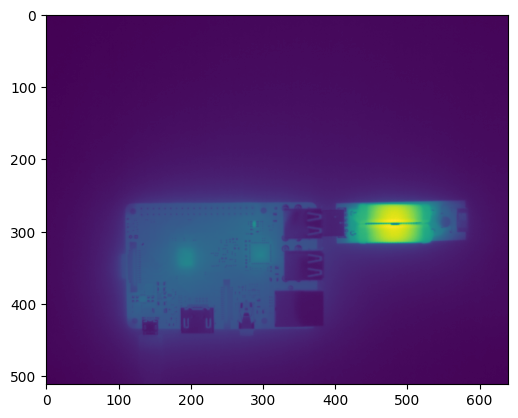

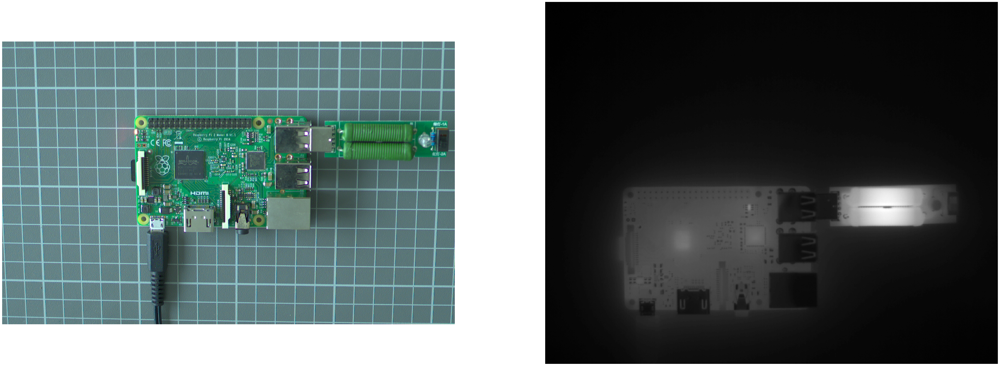

In [161]:
image_path = "./data/data_rgb.png"
sheet_path = "./data/data_temps.csv"
img = load_image(image_path)
data = load_termo_csv(sheet_path)
norm_data = normalized_image(data)

plt.imshow(data)
plt.show()
plot_images(img, norm_data)


### 2) Vypište hodnoty několika teplot
Zvolte v obraze **3 body** a vypište hodnoty teploty v těchto bodech. Snažte se najít místa s **nejvyššími** teplotami.

<div style="color: blue; text-align: right">[ 0,5 bodu ]</div>

In [162]:
flat = data.flatten()
indexes = np.argpartition(flat, -3)[-3:]
indexes = indexes[np.argsort(flat[indexes])[::-1]]
indexes_2d = np.unravel_index(indexes, data.shape)

for x, y in zip(indexes_2d[0], indexes_2d[1]):
    print(f"Point: (x={x}, y={y}) = {data[x][y]}")


Point: (x=286, y=482) = 68.1
Point: (x=294, y=479) = 68.1
Point: (x=285, y=483) = 68.1


### 3) Namapujte termosnímek na RGB
Uvědomte si, že snímky **nejsou stejně velké** ani foceny ze **stejného úhlu**. Pamatujte, že je **důležité** uvědomit si **správně rovinu**, ve které pracujeme. Zobrazte jak obrázek RGB, tak namapovaný termosnímek.

Klíčová slova:
- přiřazení dvojic bodů
- hledání transformační matice
- warpování termosnímku na perspektivu RGB

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

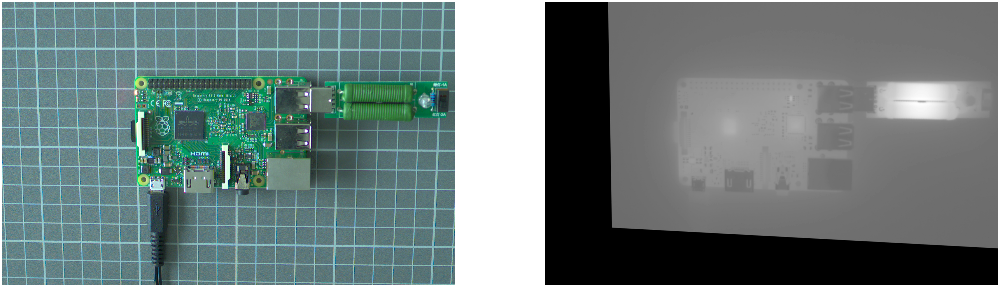

In [163]:
# show_images(norm_data_RGB)
# x = 116, y = 266
# x = 119, y = 430
# x = 580, y = 258 1
# x = 364, y = 268 1

# show_images(img)
# x = 576, y = 333
# x = 585, y = 765
# x = 1884, y = 489 1
# x = 1890, y = 338 1

data_bounds = np.array([[116,266],[119,430],[581,311],[580,258]])
img_bounds = np.array([[576,333],[585,765],[1884,489],[1890,338]])
H, mask = cv2.findHomography(data_bounds, img_bounds)
warped_img = cv2.warpPerspective(data, H,(img.shape[1], img.shape[0]))
plot_images(img,normalized_image(warped_img))

### 4) Segmentujte v termosnímku
Pomocí rozsahu **reálných teplot** (ne jasových hodnot) vytvořte binární masku, která bude obsahovat **celé Raspberry Pi** bez připojených USB rezistorů. Masku zobrazte.

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

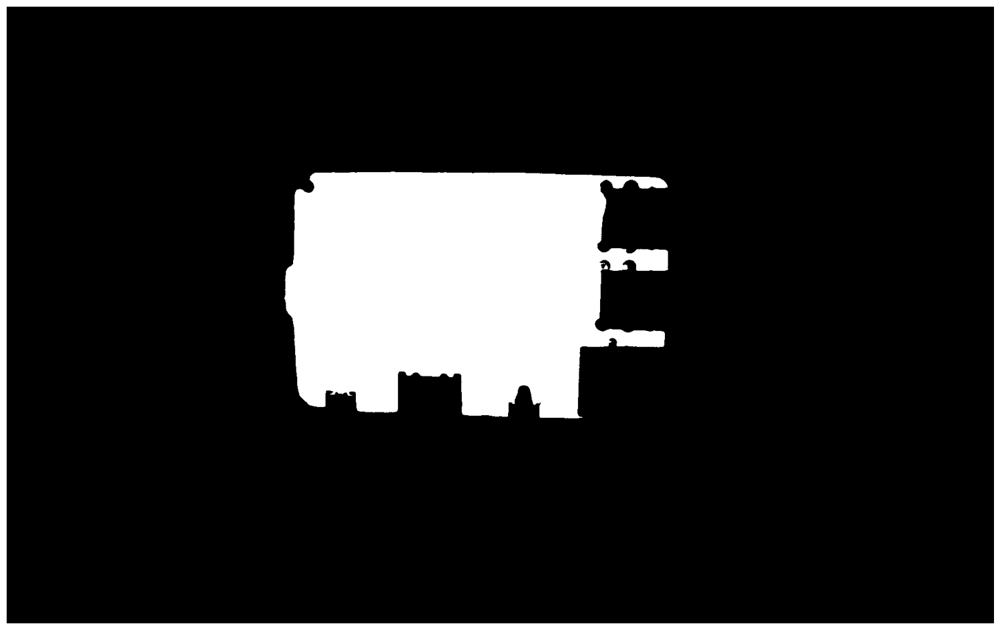

In [164]:
n = (warped_img.copy())
n = segmentation_two_thresholds(n, 36, 50)
mask,_,all_c = find_contours(n, min_area = 100000)
plot_images(normalized_image(mask))

### 5) Aplikujte data teplot na RGB obraz
Pomocí výše vytvořené **binární masky** segmentujte **data teplot**. Ty následně zobrazte pomocí vybrané [JET colormapy](https://docs.opencv.org/3.2.0/d3/d50/group__imgproc__colormap.html). Jako dílčí výstup **vytvořte funkci** pro **min-max normalizaci** teplotních hodnot obrazu, která přímá na vstupu **min, max, newmin, newmax**. Bude se hodit při aplikaci colormapy. Dále se vám může hodit funkce `to_3_channels()` k snadnějším bitovým operacím. Její využití však není podmínkou, způsobů získání výsledku je více.

Snímek by měl vypadat následovně (nenechte se zmást zobrazením BGR $\leftrightarrow$ RGB při používání matplotlibu).

![](images/fuse.png)

Klíčová slova:
- min-max normalizace
- aplikace colormapy
- segmentace pomocí masky
- vážené spojení dvou obrazů

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

In [276]:
# Min-max normalization
def min_max_norm(image, new_min=0, new_max=255):
    img_min = np.min(image)
    img_max = np.max(image)
    normalized_img = (image - img_min) / (img_max - img_min) 
    normalized_img *= new_max - new_min
    normalized_img += new_min
    return np.clip(normalized_img, new_min, new_max).astype(np.uint8)


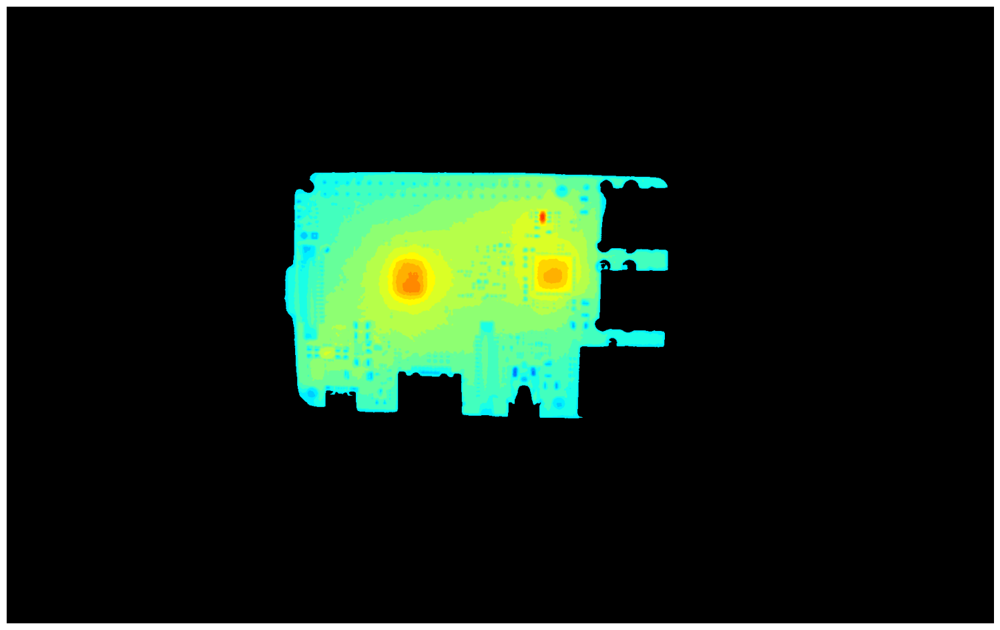

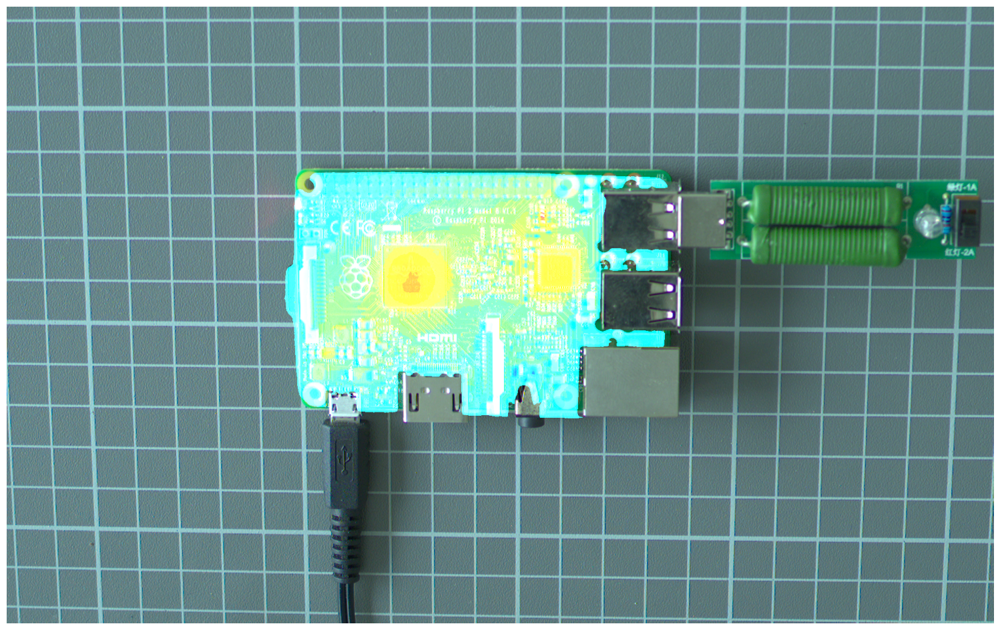

In [286]:
mask = mask.astype(np.uint8)
masked = apply_mask(warped_img.astype(np.uint8), mask)
norm = min_max_norm(masked, 0, 465)
dst = cv2.applyColorMap(norm, cv2.COLORMAP_JET)
masked_dst = apply_mask(dst, mask)
blended = cv2.addWeighted(img, 1, masked_dst, 1, 0)
plot_images(masked_dst)
plot_images(blended)

### 6) Segmentujte součástky
Využijte teplotní data k segmentaci **pouze 2 zahřívajících se** součástek - mikročipů. Zajímá nás plocha, která má teplotu vyšší než **43 °C**.

Při jejich hledání **využijte** informaci, že hledané mikročipy mají přibližně tvar čtverce.

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

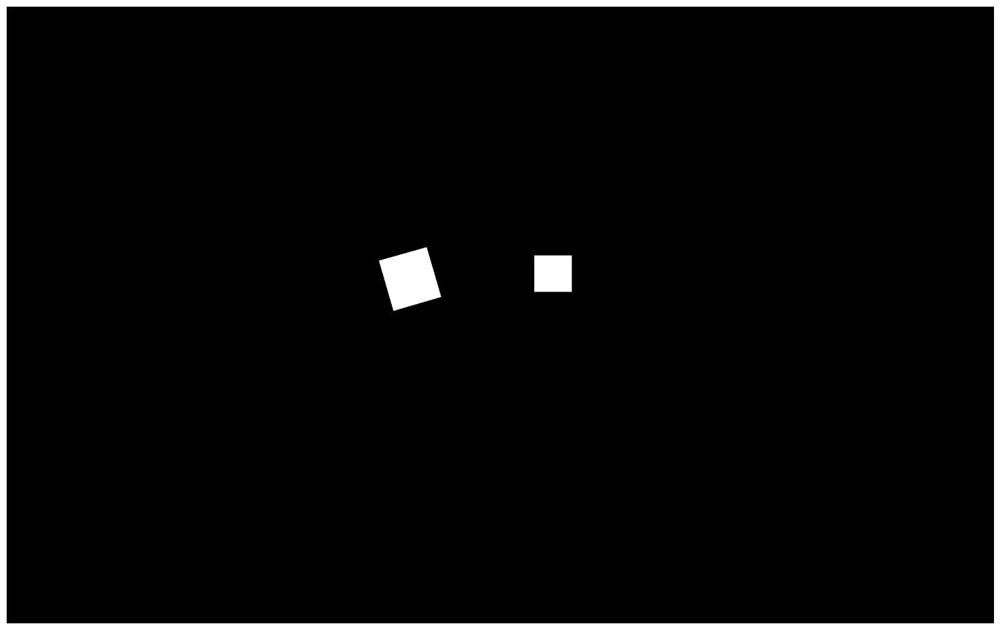

In [296]:
seg = segmentation_one_threshold(warped_img, 43)
norm_seg = normalized_image(seg)
_, _, all_conts = find_contours(norm_seg)
chip_mask = np.zeros_like(norm_seg) 
for c in all_conts:
    rect = cv2.minAreaRect(c)
    box = cv2.boxPoints(rect)
    box = np.int32(box)  # Převod na celá čísla
    
    width = rect[1][0]
    height = rect[1][1]
    aspect_ratio = min(width, height) / max(width, height)
    if 0.9 <aspect_ratio < 1.1:
        cv2.drawContours(chip_mask, [box], -1, 255, thickness=cv2.FILLED)

plot_images(chip_mask)

### 7) Zjistěte velikost mikročipů v reálných jednotkách
Zjistěte pro každý mikročip, jak velká je celková zahřívaná plocha v cm$^2$, mající vyšší teplotu než je pro nás kritických **43 °C**. Pro přechod z pixelů do reálných jednotek jsme důkladně cvičili 2 různé způsoby. V tomto případě, je ale jeden z nich správnější, než ten druhý. Vyberte, který chcete, o absolutní přesnost zde v tuhle chvíli nejde. Disktutujte však správnost vybraného postupu.

**HINT -** Perspektiva.

<div style="color: blue; text-align: right">[ 1 bod ]</div>

In [ ]:
# show_images(blended)
# x = 773, y = 805
# x = 896, y = 810
# x = 772, y = 714

In [315]:
chip_sizes_pixels = []
_,_,all_conts = find_contours(chip_mask)
for c in all_conts:
    area_pixels = cv2.contourArea(c)
    chip_sizes_pixels.append(area_pixels)
    
#Raspberry Pi 2 (Model B) HDMI v cm
HDMI_x_cm = 1.39
HDMI_y_cm = 1.2
HDMI_x_px = 896 - 773
HDMI_y_px = 805 - 714
ratio = (HDMI_x_cm * HDMI_y_cm) / (HDMI_x_px * HDMI_y_px) 
print(ratio)

for idx, size in enumerate(chip_sizes_pixels):
    print(f'{ratio*size:.2f} cm^2')

0.00014902170999731975
0.75 cm^2
1.43 cm^2


---

### 8) Prémium #1
Nabízím 1 prémiový bod za detekci středů kružnic v RGB i v termo automatizovaně pomocí algoritmů. Například pomocí Houghovy transformace nebo i třeba hranové detekce + tvarových charakteristik. Jde primárně o díry na šrouby, které lze využít k hledání korespondenčních bodů a následné aplikaci perspektivní transformace.

### 9) Prémium #2
Nabízím 1 prémiový bod za výpočet plochy v cm$^2$ obou mikročipů v RGB obraze. Následně je nutné výsledky dát do poměru s vypočtenou plochou z termo snímku, která se zahřívala nad kritických 43° C. Tím lze například porovnat, který z nich se více zahřívá.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=cb96ed8f-8ccb-4e75-aa03-5c9798c13a08' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>